# Razik DJAFRI - Amar BACHA

# Import Libraries

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os
import glob as gb
import pandas as pd
import cv2
from skimage import io
import random
import keras
from keras.utils.vis_utils import plot_model
import skimage.transform as trans
from skimage.transform import resize
from keras.models import *
from keras.layers import *
from keras.optimizers import *
from keras.callbacks import ModelCheckpoint, LearningRateScheduler
from keras import backend as keras
from keras.preprocessing.image import ImageDataGenerator
import timeit
from numpy import expand_dims

In [ ]:
!pip install -q -U albumentations
!echo "$(pip freeze | grep albumentations) is successfully installed"

albumentations==0.5.2 is successfully installed


# 1.OPEN FOLDERS

let's first check our data folders
 to have a look to its content

In [ ]:
train_path ="/content/drive/MyDrive/Colab Notebooks/UNET project/data/Train data"
test_path = "/content/drive/MyDrive/Colab Notebooks/UNET project/data/Test data"
mask_path = "/content/drive/MyDrive/Colab Notebooks/UNET project/data/Mask"

In [ ]:
def openFolders(path):
  for folder in  os.listdir(path) : 
    files = gb.glob(pathname= str( path +'//' + folder + '/*.png'))
    print('- For data {:<15} :  found {} images in folder {:8}'.format(folder,len(files),folder))

In [ ]:
openFolders(path=train_path)
openFolders(path=test_path)
openFolders(path=mask_path)

- For data train           :  found 30 images in folder train   
- For data test            :  found 30 images in folder test    
- For data mask            :  found 30 images in folder mask    


# 2. Checking Images
now we need to check the images sizes , to know how they looks like

### Images sizes in our folders

In [ ]:
def check_size_images(path):
  size = []
  for folder in  os.listdir(path) : 
      files = gb.glob(pathname= str(path +'//' + folder + '/*.png'))
      for file in files: 
          image = io.imread(file)
          #image = np.expand_dims(image, axis=2)
          size.append(image.shape)
  df=pd.Series.value_counts(size)
  print('Folder:',folder)
  #print("-"*15)
  print('Shape and number of the images = {}'.format(df))
  print('-'*50)

In [ ]:
check_size_images(train_path)
check_size_images(test_path)
check_size_images(mask_path)

Folder: train
Shape and number of the images = (512, 512)    30
dtype: int64
--------------------------------------------------
Folder: test
Shape and number of the images = (512, 512)    30
dtype: int64
--------------------------------------------------
Folder: mask
Shape and number of the images = (512, 512)    30
dtype: int64
--------------------------------------------------


# 3. Reading Images 
now it's time to read all images & convert it into arrays

In [ ]:
# Get  images and masks

def Read_images(path):
  X = []
  for folder in  os.listdir(path) : 
    files = sorted(gb.glob(pathname= str( path  +'//' + folder + '/*png')))
    print(f'Getting {folder}  images  ... ')
    for file in files: 
       
        image = io.imread(file)
        #image=img_to_array(image)
        #image = np.expand_dims(image, axis=2)
        #image_array=cv2.resize(image,(size,size))
        X.append(list(image))
  X_array = np.array(X) # convert list to array
  print(f'- shape of {folder} data {X_array.shape}')
  print(f'- {X_array.shape[0]} images , size = {X_array.shape[1]} X {X_array.shape[2]}')
  print("-"*40)
  return X_array

In [ ]:
X_train=Read_images(train_path)
X_test=Read_images(test_path)
mask=Read_images(mask_path)

Getting train  images  ... 
- shape of train data (30, 512, 512)
- 30 images , size = 512 X 512
----------------------------------------
Getting test  images  ... 
- shape of test data (30, 512, 512)
- 30 images , size = 512 X 512
----------------------------------------
Getting mask  images  ... 
- shape of mask data (30, 512, 512)
- 30 images , size = 512 X 512
----------------------------------------


### Let's see if things look all right by drawing some random images and their associated masks.

In [ ]:
def visualize_images_and_masks (X,Y,no_of_images) :

  """
  X : images (X_train)
  Y :mask (label)
  no_of_images : the number of images to show randomly 

  """
  #random without repetion
  z=X.shape[0]
  if no_of_images > z: print(f'ERREUR the number of images should be <= {z}')
  else:
    l=int(np.ceil(np.sqrt(no_of_images)))
    plt.figure(figsize=(20,20))
    n=0
    for i in (random.sample(range(z),no_of_images) ):
      plt.subplot(l*2,l,n+1)
      imgmask=np.hstack((X[i],Y[i]))
      plt.imshow(imgmask,'gray')
      plt.title(f'image {i} \n image + mask')  
      plt.axis('off')
      n=n+1

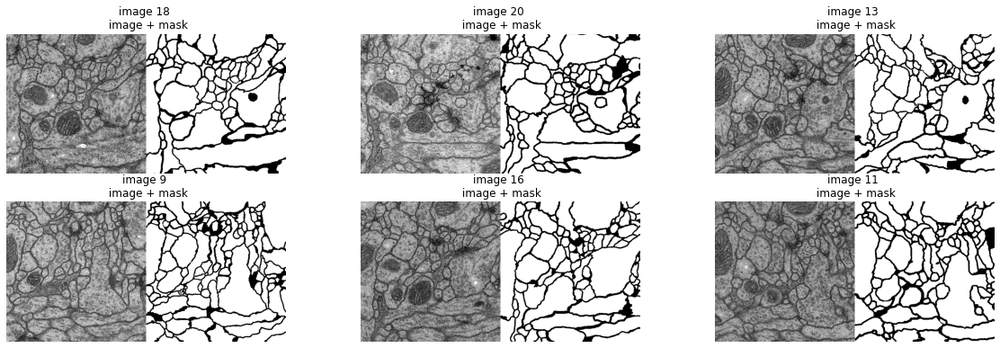

In [ ]:
# let's choose 6 images 
visualize_images_and_masks (X=X_train,Y=mask,no_of_images=6)

# 4. Data augmentation
Generate “new” training samples from the original ones by applying random Fitters and perturbations (but at the same time ensuring that the class labels of the data are not changed).

Pour la classification d'image, nous devons modifier uniquement une image d'entrée et conserver les étiquettes de sortie intactes car les étiquettes de sortie sont invariantes aux modifications d'image.

Pour la segmentation, nous devons appliquer certaines transformations à la fois à une image d'entrée et à un masque de sortie. Nous devons également utiliser les mêmes paramètres pour la transformation d'image et la transformation de masque.(Lorsque on applique des transformations d'image telles que la mise en miroir ou la rotation ou le recadrage d'une partie de l'image d'entrée, on doit également appliquer la même transformation à l'étiquette de sortie pour préserver son exactitude.)




##- Combining dataset generation(dataset expansion) and in-place augmentation :

# 4.1 Dataset generation(dataset expansion) 

### Define a list of transformations

In [ ]:
import albumentations as A
##############################################                       
Horizontal = A.HorizontalFlip(p=1)
Vertical =A.VerticalFlip(p=1)
Transpose=A.Transpose(p=1)
ElasticTransform= A.ElasticTransform(p=1, alpha=120, sigma=120 * 0.05, alpha_affine=120 * 0.03)
GridDistortion=A.GridDistortion(p=1)
OpticalDistortion= A.OpticalDistortion(distort_limit=1.6, shift_limit=0.5, p=1)

In [ ]:
list_transformations=[Horizontal,Vertical,Transpose,ElasticTransform,GridDistortion,
                      OpticalDistortion]

### Define a function for the transformations 


*    we create an empty list called : transformations
*   then we add to this empty list  a new liste of transformation which contains all the possible combinations of  list_transformations (the first one)




 
  


In [ ]:
def Transformation(Transformations = list_transformations ):
  from itertools import combinations 
  global nb_transformations # need to use it after
  transformations=[]  
  for i in range (1,len(list_transformations)+1):
    Combination_transformation =combinations (list_transformations,i)
    for trans in (Combination_transformation):  
        transform=A.Compose(list(trans))
        transformations.append(transform)
  nb_transformations=len(transformations)
  print(f'- The number of transforamtions for each image is {nb_transformations} , Wait...') 
  return transformations

### Dataset Generation function 

In [ ]:
def DatasetGeneration(images,masks):

  start = timeit.default_timer()
  global image
  image=list(images)
  mask=list(masks)
  ################
  augmented_images=[]
  augmented_masks=[]
  ################
  transformation=Transformation(Transformations = list_transformations )
  for i in range(len(image)):
    augmented_images.append(image[i])
    augmented_masks.append(mask[i])
    for transform in (transformation):
      augmented = transform(image=image[i], mask=mask[i])
      aug_image =augmented['image']
      augmented_images.append(aug_image)
      aug_mask = augmented['mask']
      augmented_masks.append(aug_mask)
  augmented_images = np.array(augmented_images)
  print('DONE !')
  print(f'- Number of images after Data Generation is {augmented_images.shape}')
  augmented_masks=np.array(augmented_masks)
  print(f'- Number of mask after Data Generation is {augmented_masks.shape}')

  stop = timeit.default_timer()    
  t=stop - start
  if t<60 :
    print(f'Time execution : { np.round(t,2)} secondes') 
  else : print(f'- Time execution : { np.round((t/60),2)} minutes') 
  return augmented_images,augmented_masks

### Display data generated function

In [ ]:
def display_data_generated(data,no_of_images,no_of_transforamtions=7):
  n=0
  lenT=nb_transformations+1
  lenI=no_of_images*lenT
  v=lenI/4

  if no_of_transforamtions > lenT-1:
    print(f'number of transormation should be less then or equal  {lenT-1}')
  else:
    for j in range(lenT,lenI+1,lenT):
      print('-'*130)
      fig = plt.figure()
      print('image',int(np.divide(j,lenT)-1))
      print('-'*130)
      LIST=[]
      for i in range(j-lenT,j):
        LIST.append(data[i])
      for k in range(no_of_transforamtions+1):
        fig.set_size_inches(20, 100)
        ax = fig.add_subplot(v,4,n+1)
        io.imshow(LIST[k])
        if k == 0:plt.title('original image')
        else:plt.title(f'transformation')
        plt.axis('off')
        n+=1
      plt.show()

## Let's try it with one image (test these transformations how they look)
to see things better, we choose a normal image and not a medical image 

In [ ]:
def example(img):
  transforamtion=Transformation(Transformations = list_transformations )
  aug=[]
  aug.append(img)
  for transform in (transforamtion):
    augmented = transform(image=img)
    aug_image =augmented['image']
    aug.append(aug_image)
  aug=np.array(aug)
  print('DONE!')
  return aug

In [ ]:
imgexample='/content/drive/MyDrive/Colab Notebooks/UNET project/data/Dataset Generation/example/RayzedPhotography.jpg'
img =io.imread(imgexample) 
aug=example(img=img)

- The number of transforamtions for each image is 63 , Wait...
DONE!


----------------------------------------------------------------------------------------------------------------------------------
image 0
----------------------------------------------------------------------------------------------------------------------------------


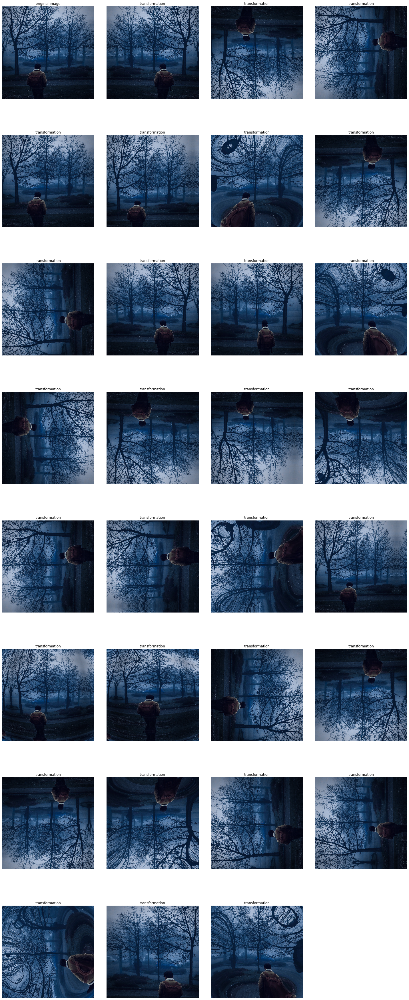

In [ ]:
#let's show just 30 transformations
display_data_generated(data=aug,no_of_images=1,no_of_transforamtions=30)

# let's now work with our  data medical

In [ ]:
augmented_images,augmented_masks=DatasetGeneration(X_train,mask)

- The number of transforamtions for each image is 63 , Wait...
DONE !
- Number of images after Data Generation is (1920, 512, 512)
- Number of mask after Data Generation is (1920, 512, 512)
- Time execution : 1.94 minutes


## show some transformations for augmeneted image( show 1 images) 

----------------------------------------------------------------------------------------------------------------------------------
image 0
----------------------------------------------------------------------------------------------------------------------------------


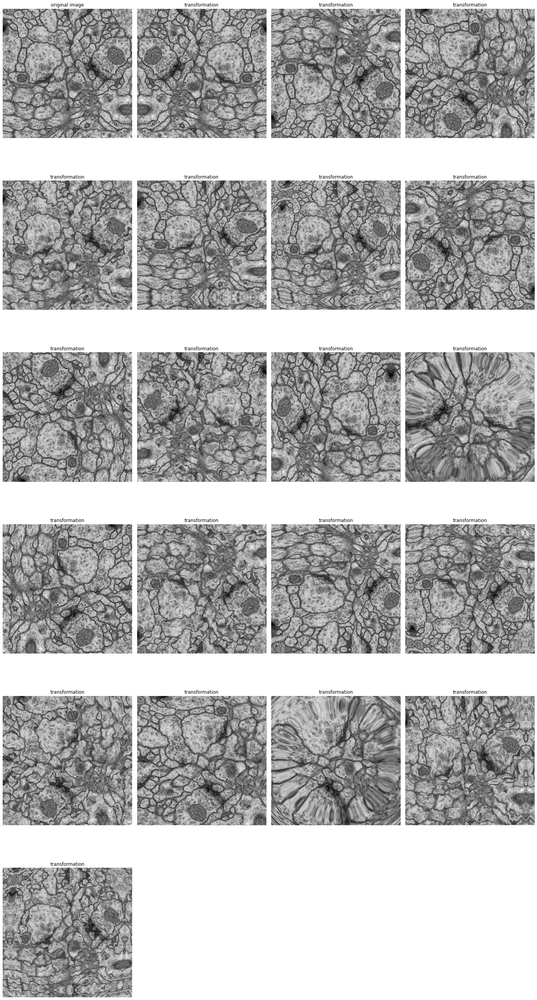

In [ ]:
#let's show 20 transformations
display_data_generated(data=augmented_images,no_of_images=1,no_of_transforamtions=20)

### show augmented (images + mask) randomly 

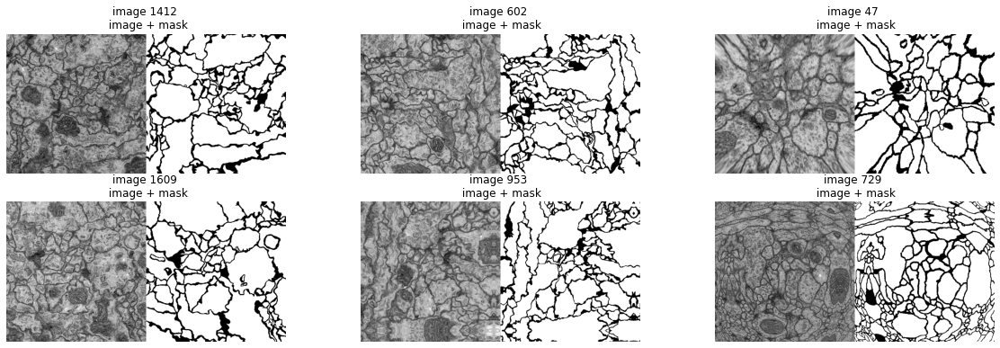

In [ ]:
visualize_images_and_masks (augmented_images,augmented_masks,6)

### Split our data on training set et validation set

In [ ]:
from sklearn.model_selection import train_test_split
img_train, img_valid, mask_train, mask_valid = train_test_split(augmented_images, augmented_masks, test_size=0.25, random_state=42,)

## Store data to disk : Images and masks


#### function to store data 

In [ ]:
########################## STORE IMAGES ON DISK ############################################

def store_to_disk(images,disk_dir_images,masks,disk_dir_masks):

    """ Stores an array of images to disk
        Parameters:
        ---------------
        images       images array, (N, 512, 512, 1) to be stored
        masks        masks  array, (N, 512, 512, 1) to be stored    
    """
    import timeit
    start = timeit.default_timer()
    # num_images = len(images)

    # Save all the images one by one ,i suggest to use imsave  from skit image to save your images bcse it save them  without changing thier pixels
    for i, image in enumerate(images):
        io.imsave(disk_dir_images / f"{i}.png",image)

    # Save all the masks one by one
    for j, mask in enumerate(masks):
        io.imsave(disk_dir_masks / f"{j}.png",mask)
    stop = timeit.default_timer()
    print('Data saved successfully')
    t=stop - start
    if t<60 :print(f'Time execution : { np.round(t,2)} secondes') 
    else : print(f'Time execution : { np.round((t/60),2)} minutes') 

In [ ]:
from pathlib import Path

disk_dir_images_train = Path("/content/drive/MyDrive/Colab Notebooks/UNET project/data/Dataset Generation/Augmented Training  images")
disk_dir_masks_train = Path("/content/drive/MyDrive/Colab Notebooks/UNET project/data/Dataset Generation/Augmented Training masks")
########
disk_dir_images_valid=Path("/content/drive/MyDrive/Colab Notebooks/UNET project/data/Dataset Generation/Augmented valid images")
disk_dir_masks_valid=Path("/content/drive/MyDrive/Colab Notebooks/UNET project/data/Dataset Generation/Augmented valid masks")
#########
disk_dir_images_train.mkdir(parents=True, exist_ok=True)
disk_dir_masks_train.mkdir(parents=True, exist_ok=True)
disk_dir_images_valid.mkdir(parents=True, exist_ok=True)
disk_dir_masks_valid.mkdir(parents=True, exist_ok=True)

In [ ]:
print("Save Training data...")
store_to_disk(img_train,disk_dir_images_train,mask_train,disk_dir_masks_train)

Save Training data...
Data saved successfully
Time execution : 16.08 minutes


In [ ]:
print("Save Validation data...")
store_to_disk(img_valid,disk_dir_images_valid,mask_valid,disk_dir_masks_valid)

Save Validation data...
Data saved successfully
Time execution : 5.03 minutes


#### Now Check th stored data 

In [ ]:
openFolders("/content/drive/MyDrive/Colab Notebooks/UNET project/data/Dataset Generation")

- For data In place augmentation :  found 0 images in folder In place augmentation
- For data Augmented Training  images :  found 1440 images in folder Augmented Training  images
- For data Augmented Training masks :  found 1440 images in folder Augmented Training masks
- For data Augmented valid images :  found 480 images in folder Augmented valid images
- For data Augmented valid masks :  found 480 images in folder Augmented valid masks
- For data example         :  found 0 images in folder example 


In [ ]:
totaltrain=1440
totalvalid=480

# **4.2.In-place augmentation** 

second type of augmentation is in place augmentation ( using keras datagenerator)

In [ ]:
def In_place_augmentation(data_path,image_folder,mask_folder,transformations_list,batch_size,
                          target_size = (256,256),store_to_disk = None):
    '''
    generate image and mask at the same time
    use the same seed for image_datagen and mask_datagen to ensure the transformation for image and mask is the same
    '''
    image_AUG = ImageDataGenerator(**transformations_list)
    mask_AUG = ImageDataGenerator(**transformations_list)

    images_In_place_AUG = image_AUG.flow_from_directory(
        data_path,
        classes = [image_folder],
        class_mode = None,
        color_mode = 'grayscale',
        target_size = target_size,
        batch_size = batch_size,
        save_to_dir = store_to_disk,
        save_prefix  = 'image',
        seed = 1)
    masks_In_place_AUG = mask_AUG.flow_from_directory(
        data_path,
        classes = [mask_folder],
        class_mode = None,
        color_mode = 'grayscale',
        target_size = target_size,
        batch_size = batch_size,
        save_to_dir = store_to_disk,
        save_prefix  = 'mask',
        seed = 1)   
    for (img,mask) in zip( images_In_place_AUG, masks_In_place_AUG):
      #normalization
      if(np.max(img) > 1):
        img = img / 255
        mask = mask /255
        mask[mask > 0.5] = 1
        mask[mask <= 0.5] = 0
      yield (img,mask)

#### function to display (in place augmentation)

In [ ]:
def display_In_place_aug(data_In_place_aug,batch_size):
  plt.figure(figsize=(30, 15))
  for i in range(0, batch_size):
      plt.subplot(3, 3, i+1)
      for batch in data_In_place_aug:
          image = batch[0][0][:,:,0]
          mask=batch[1][0][:,:,0]
          print("check the pixels of mask ",np.unique(mask))
          image_mask=np.hstack((image,mask))
          io.imshow(image_mask)
          break
  plt.tight_layout()
  plt.show()

## Try In_place_augmentation with an example  

In [ ]:
transformations_list= dict(rotation_range=0.2,
                           horizontal_flip=True,
                           vertical_flip=True,
                           width_shift_range=0.06,
                           height_shift_range=0.03,
                           shear_range=0.02,
                           zoom_range=0.07,
                           fill_mode='nearest')

In [ ]:
example = In_place_augmentation(data_path = "/content/drive/MyDrive/Colab Notebooks/UNET project/data/Dataset Generation",
                                          image_folder = 'example' ,
                                          mask_folder = 'example' ,
                                          transformations_list= transformations_list ,
                                          batch_size=5,
                                          target_size = (256,256),
                                          store_to_disk =None)

Found 1 images belonging to 1 classes.
Found 1 images belonging to 1 classes.
check the pixels of mask  [0. 1.]
check the pixels of mask  [0. 1.]
check the pixels of mask  [0. 1.]
check the pixels of mask  [0. 1.]
check the pixels of mask  [0. 1.]


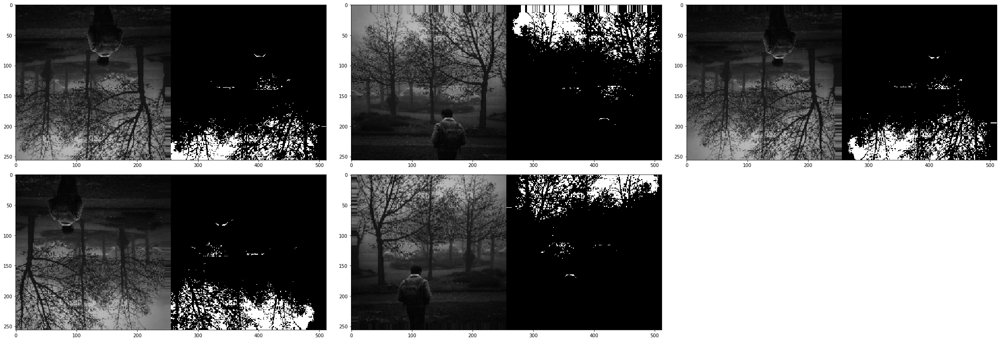

In [ ]:
display_In_place_aug(example,batch_size=5)

# Application : BIOMEDICAL IMAGES

In [ ]:
data_path='/content/drive/MyDrive/Colab Notebooks/UNET project/data/Dataset Generation'

In [ ]:
def augmented(batch_size,data_path=data_path) : 
  train_In_place_aug =In_place_augmentation(data_path = data_path,
                                          image_folder = 'Augmented Training  images' ,
                                          mask_folder = 'Augmented Training masks' ,
                                          transformations_list= transformations_list ,
                                          batch_size=batch_size,
                                          target_size = (256,256),
                                          store_to_disk =None)
  valid_In_place_aug = In_place_augmentation(data_path = data_path,
                                          image_folder = 'Augmented valid images' ,
                                          mask_folder = 'Augmented valid masks' ,
                                          transformations_list= transformations_list ,
                                          batch_size=batch_size,
                                          target_size = (256,256),
                                          store_to_disk =None)
  return  train_In_place_aug,valid_In_place_aug 

# 5. Build the MODEL 

## Callbacks

In [ ]:
from keras.callbacks import EarlyStopping, ReduceLROnPlateau

### Early Stop
 To prevent over fitting we will stop the learning after 10 epochs and val_loss value not decreased

In [ ]:
earlystop = EarlyStopping(patience=10)

### Learning Rate Reduction

We will reduce the learning rate when then accuracy not increase for 2 steps

In [ ]:
learning_rate_reduction = ReduceLROnPlateau(monitor='val_accuracy', 
                                            patience=2, 
                                            verbose=1, 
                                            factor=0.5, 
                                            min_lr=0.00001)

### Checkpoint 
save best model 

In [ ]:
savemodel='/content/drive/MyDrive/Colab Notebooks/UNET project/Best model'

In [ ]:
model_checkpoint = ModelCheckpoint(savemodel+'/Best model.hdf5', monitor='loss',verbose=1, save_best_only=True)

### callbacks 

In [ ]:
callbacks = [earlystop, learning_rate_reduction,model_checkpoint]

## U-net architecture 

In [ ]:
def UNET_model(IMG_WIDTH = 256,IMG_HEIGHT = 256,IMG_CHANNELS = 1):

# Build and train our neural network
  inputs = Input((IMG_HEIGHT, IMG_WIDTH,IMG_CHANNELS))

  #Contraction path
  c1 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(inputs)
  c1=  BatchNormalization()(c1)
  c1 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c1)
  c1=  BatchNormalization()(c1)
  p1 = MaxPooling2D((2, 2))(c1)
  p1 = Dropout(0.1)(p1)

  c2 =Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1)
  c2=  BatchNormalization()(c2)
  c2 =Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2)
  c2=  BatchNormalization()(c2)
  p2 = MaxPooling2D((2, 2))(c2)
  p2 =Dropout(0.1)(p2)
  
  c3 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2)
  c3=  BatchNormalization()(c3)
  c3 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3)
  c3=  BatchNormalization()(c3)
  p3 =MaxPooling2D((2, 2))(c3)
  p3 = Dropout(0.1)(p3)

  c4 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3)
  c4=  BatchNormalization()(c4)
  c4 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4)
  p4 = MaxPooling2D(pool_size=(2, 2))(c4)
  p4 = Dropout(0.1)(p4)
  
  c5 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4)
  c5=  BatchNormalization()(c5)
  c5 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5)

  #Expansive path 
  u6 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c5)
  u6 =concatenate([u6, c4])
  c6 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u6)
  c6 = Dropout(0.1)(c6)
  c6 =Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c6)
  
  u7 =Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c6)
  u7 =concatenate([u7, c3])
  c7 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u7)
  c7 = Dropout(0.1)(c7)
  c7 =Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c7)
  
  u8 = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(c7)
  u8 = concatenate([u8, c2])
  c8 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u8)
  c8 =Dropout(0.1)(c8)
  c8 =Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c8)
  
  u9 = Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same')(c8)
  u9 = concatenate([u9, c1], axis=3)
  c9 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u9)
  c9 =Dropout(0.1)(c9)
  c9 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c9)
  
  outputs = Conv2D(1, (1, 1), activation='sigmoid')(c9)
  
  model = Model(inputs=[inputs], outputs=[outputs])
  model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
  #model.summary()
  return model

In [ ]:
model=UNET_model(IMG_WIDTH = 256,IMG_HEIGHT = 256,IMG_CHANNELS = 1)

In [ ]:
#plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

## Train model

we trained the model several times with different number of batch size, number of epochs and different number of steps_per_epoch...

In [ ]:
train_In_place_aug,valid_In_place_aug =augmented(batch_size=15)

In [ ]:
# FRIST TRAIN 
history = model.fit_generator(
    train_In_place_aug ,
    epochs=10,
    validation_data=valid_In_place_aug,
    validation_steps= 1500     ,#totalvalid//batch_size,
    steps_per_epoch=1500, #totaltrain//batch_size,
    callbacks=callbacks)

Found 1440 images belonging to 1 classes.
Found 1440 images belonging to 1 classes.
Epoch 1/10
1500/1500 [==============================] - ETA: 0s - loss: 0.2243 - accuracy: 0.9005Found 480 images belonging to 1 classes.
Found 480 images belonging to 1 classes.

Epoch 00001: loss improved from inf to 0.22426, saving model to Best model.hdf5
1500/1500 [==============================] - 1977s 1s/step - loss: 0.2243 - accuracy: 0.9005 - val_loss: 0.2023 - val_accuracy: 0.9106
Epoch 2/10
1500/1500 [==============================] - ETA: 0s - loss: 0.1998 - accuracy: 0.9121
Epoch 00002: loss improved from 0.22426 to 0.19981, saving model to Best model.hdf5
1500/1500 [==============================] - 1938s 1s/step - loss: 0.1998 - accuracy: 0.9121 - val_loss: 0.1909 - val_accuracy: 0.9160
Epoch 3/10
1500/1500 [==============================] - ETA: 0s - loss: 0.1924 - accuracy: 0.9155
Epoch 00003: loss improved from 0.19981 to 0.19240, saving model to Best model.hdf5
1500/1500 [===========

In [ ]:
# last train of the best model
history = model.fit_generator(
    train_In_place_aug ,
    epochs=10,
    validation_data=valid_In_place_aug,
    validation_steps= 500 ,#totalvalid//batch_size,
    steps_per_epoch=500, #totaltrain//batch_size,
    callbacks=callbacks)

Found 1440 images belonging to 1 classes.
Found 1440 images belonging to 1 classes.
Epoch 1/10
500/500 [==============================] - ETA: 0s - loss: 0.1482 - accuracy: 0.9350Found 480 images belonging to 1 classes.
Found 480 images belonging to 1 classes.

Epoch 00001: loss improved from inf to 0.14821, saving model to Best model.hdf5
500/500 [==============================] - 223s 446ms/step - loss: 0.1482 - accuracy: 0.9350 - val_loss: 0.1580 - val_accuracy: 0.9315
Epoch 2/10
500/500 [==============================] - ETA: 0s - loss: 0.1481 - accuracy: 0.9351
Epoch 00002: loss improved from 0.14821 to 0.14806, saving model to Best model.hdf5
500/500 [==============================] - 205s 409ms/step - loss: 0.1481 - accuracy: 0.9351 - val_loss: 0.1602 - val_accuracy: 0.9311
Epoch 3/10
500/500 [==============================] - ETA: 0s - loss: 0.1512 - accuracy: 0.9346
Epoch 00003: ReduceLROnPlateau reducing learning rate to 1e-05.

Epoch 00003: loss did not improve from 0.14806


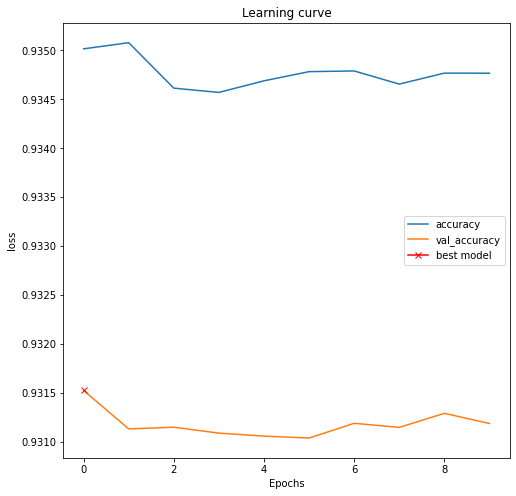

In [ ]:
plt.figure(figsize=(8, 8))
plt.title("Learning curve")
plt.plot(history.history['accuracy'], label="accuracy")
plt.plot(history.history['val_accuracy'], label="val_accuracy")
plt.plot( np.argmax(history.history["val_accuracy"]), np.max(history.history["val_accuracy"]), marker="x", color="r", label="best model")
plt.xlabel("Epochs")
plt.ylabel("loss")
plt.legend()


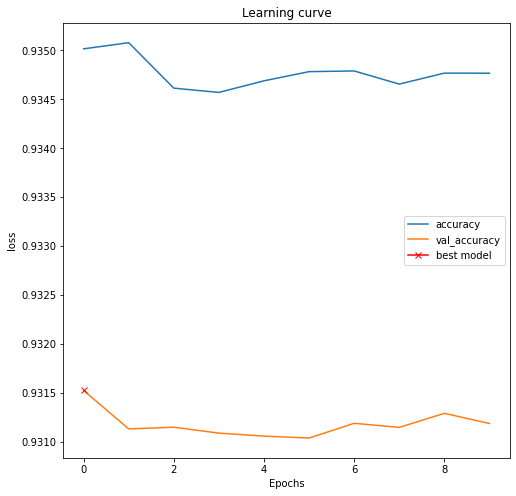

In [ ]:
plt.figure(figsize=(8, 8))
plt.title("Learning curve")
plt.plot(history.history['accuracy'], label="accuracy")
plt.plot(history.history['val_accuracy'], label="val_accuracy")
plt.plot( np.argmax(history.history["val_accuracy"]), np.max(history.history["val_accuracy"]), marker="x", color="r", label="best model")
plt.xlabel("Epochs")
plt.ylabel("loss")
plt.legend()


# 6. Predicted  test data

In [ ]:
# Get and resize test images
def Read_resize_images(path,size=256):
  X = []
  for folder in  os.listdir(path) : 
    files = sorted(gb.glob(pathname= str( path  +'//' + folder + '/*png')))
    for file in files: 
        image = io.imread(file)
        image=image/255
        #image=img_to_array(image)
        image = np.expand_dims(image, axis=2)
        image_array=resize(image,(size,size,1))
        X.append(list(image_array))
  X_array = np.array(X) # convert list to array
  print(f'- shape of {folder} data {X_array.shape}')
  print(f'- {X_array.shape[0]} images , size = {X_array.shape[1]} X {X_array.shape[2]} X {X_array.shape[3]}')
  print("-"*40)
  return X_array

### Read and resize test images 

In [ ]:
test_img=Read_resize_images(path=test_path,size=256)

- shape of test data (30, 256, 256, 1)
- 30 images , size = 256 X 256 X 1
----------------------------------------


### **load** best model

In [ ]:
model=load_model("/content/drive/MyDrive/Colab Notebooks/UNET project/Best model/Best model.hdf5")
results = model.predict(test_img)

In [ ]:
def visualize_predictions_images (X,Y,no_of_images) :

  """
  X =  images (test)
  Y= predicted mask 
  no_of_images = the number of images to show randomly 

  """
  #random without repetion
  z=X.shape[0]
  if no_of_images > z: print(f'ERREUR the number of images should be <= {z}')
  else:
    l=int(np.ceil(np.sqrt(no_of_images)))
    plt.figure(figsize=(20,20))
    n=0
    for i in (random.sample(range(z),no_of_images) ):
      plt.subplot(l*2,l,n+1)
      imgmask=np.hstack((X[i,...,0],Y[i,...,0]))
      plt.imshow(imgmask,'gray')
      plt.title(f'image {i} \n image test+  predicted mask')  
      plt.axis('off')
      n=n+1

# Predicted masks for test data

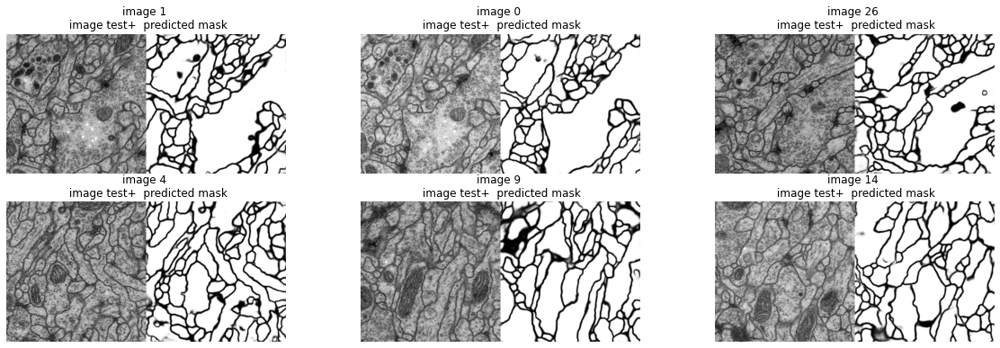

In [ ]:
visualize_predictions_images (X=test_img,Y=results,no_of_images=6)